In [1]:
%matplotlib inline

import sys
#sys.path.insert(0, '/home/space/kai/src/Viscid/')
#sys.path.insert(0, '/home/space/dominic/Viscid')


import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import viscid
from viscid.plot import vpyplot as vlt
import h5py
import pandas as pd
import os
viscid.calculator.evaluator.enabled = True

%config InlineBackend.figure_format = 'retina'


project_dir="data_m400/"


from scipy.signal import savgol_filter


In [2]:
def make_plot(time, run, fldnames=["jy"], **kwargs):
    fig, ax = plt.subplots(len(fldnames), 1, figsize=(14,4*len(fldnames)))
    if not isinstance(ax, np.ndarray): ax = [ax]
    for i, fldname in enumerate(fldnames):
        # Hack around some inconsistencies with the field naming
        if run.endswith(".vpc"):
            map = {
                "bx_fc": "Magnetic Field X",
                "by_fc": "Magnetic Field Y",
                "bz_fc": "Magnetic Field Z",
                "jx": "Free Current Field X",
                "jy": "Free Current Field Y",
                "jz": "Free Current Field Z",
                "rho_nc": "Charge Density",
                "qn_nc_e": "Charge Density (ehydro)",
                "qn_nc_i": "Charge Density (Hhydro)",
                "jy_nc_e": "Current Density (ehydro) Y",
            }
        else:
            map = {
                "bx_fc": "hx_fc",
                "by_fc": "hy_fc",
                "bz_fc": "hz_fc",
                "qn_nc_e": "rho_nc_e",
                "qn_nc_i": "rho_nc_i",
            }
        #vf = viscid.load_file(run, force_reload=True)
        #vf.activate_time(time)
        #_fldname = map[fldname] if fldname in map else fldname
        #vlt.plot(vf[_fldname], ax=ax[i], **kwargs);
        
        vf = viscid.load_file(run, force_reload=True)
        vf.activate_time(time)
        _fldname = map[fldname] if fldname in map else fldname
        mid_val = 0
        
        vlt.plot(vf[_fldname], ax=ax[i], **kwargs);
        #plt.scatter(knots[0], knots[2], color = 'k')
        #vlt.plot(vf["psi"],style="contour",levels=80,colors='k', ax=ax[i], **kwargs);

        
        

In [3]:

dir = project_dir + "/mms_kg211"
run = project_dir + "/mms_kg211/pfd.xdmf"

dir = project_dir + "/mms_kg200"
run = project_dir + "/mms_kg200/pfd.xdmf"


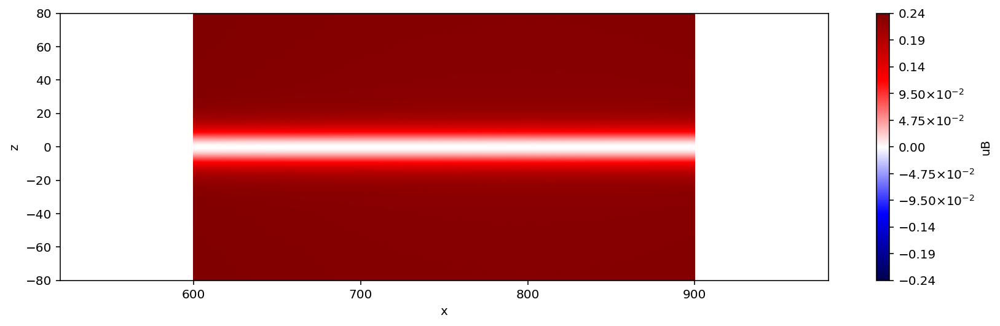

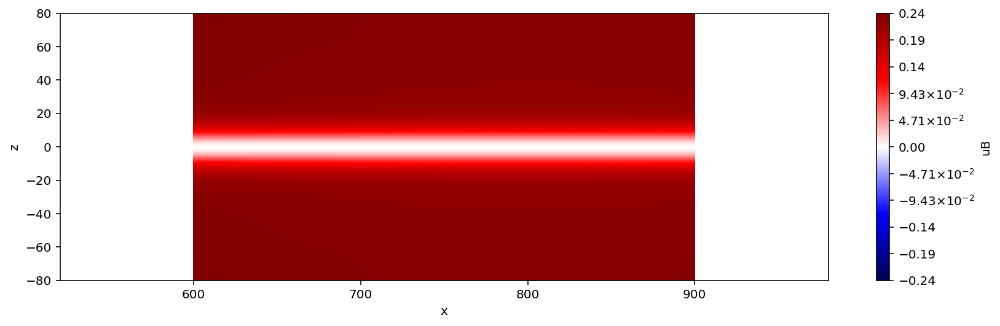

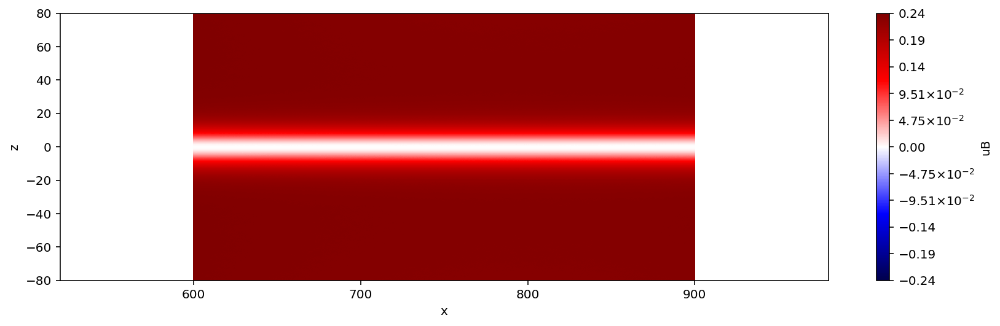

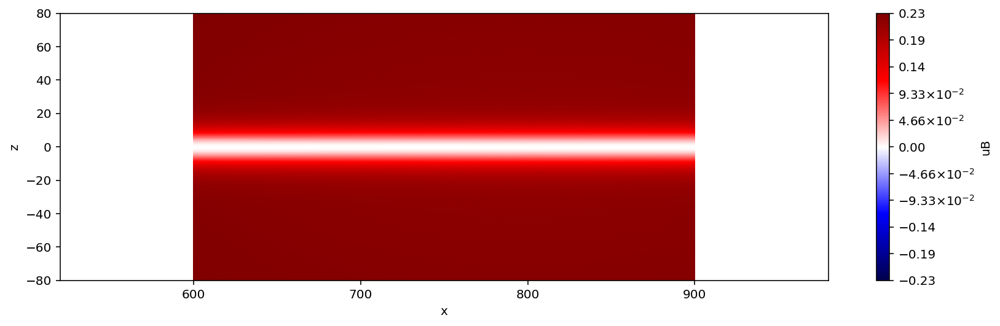

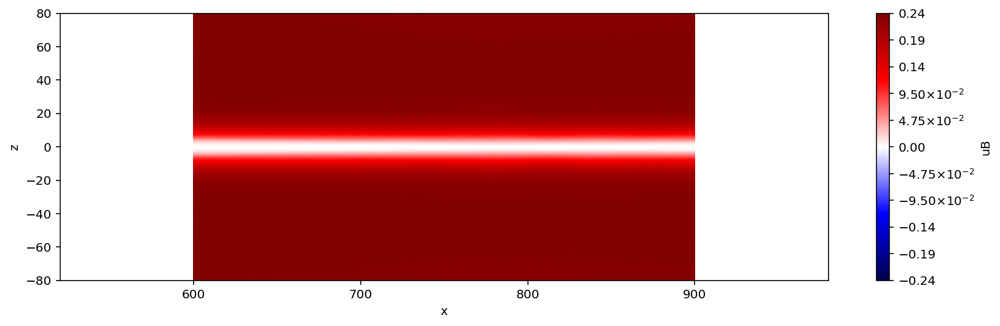

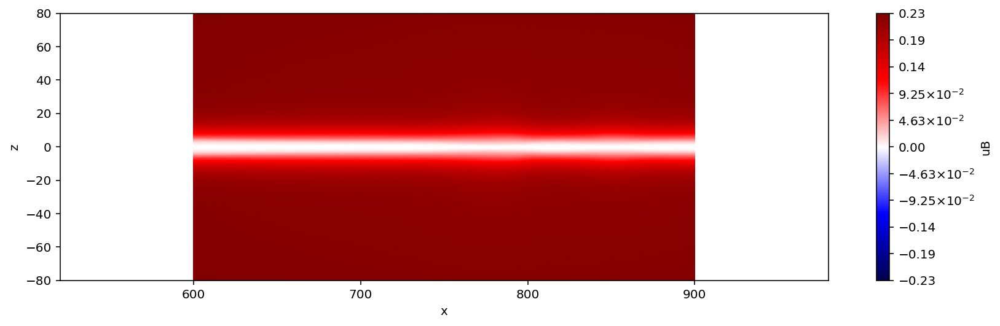

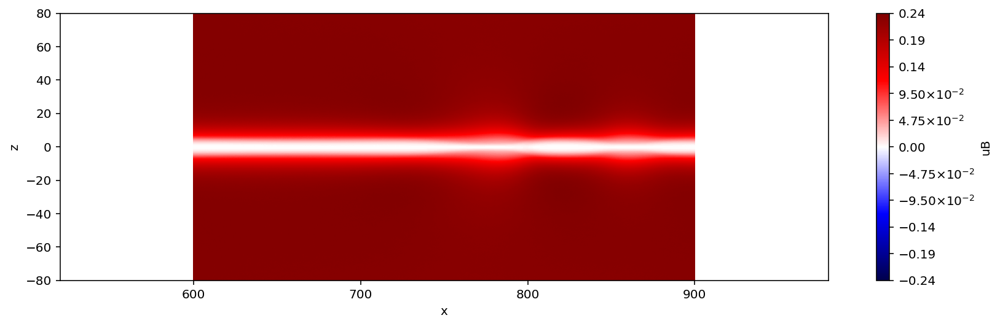

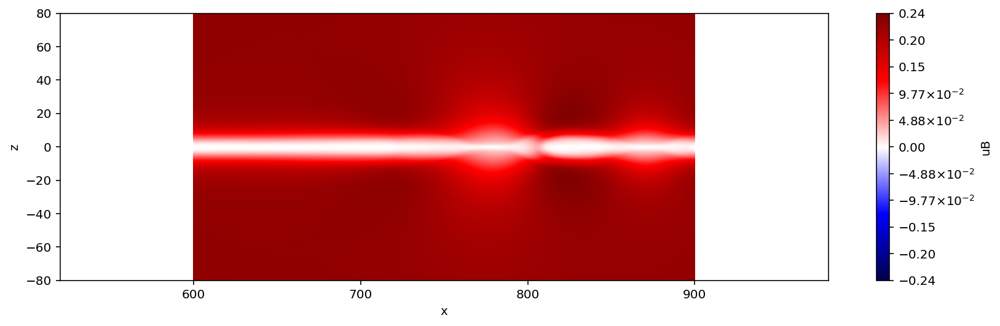

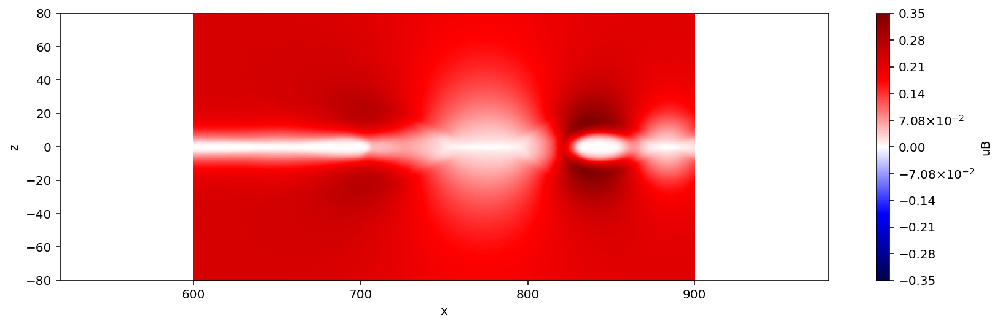

In [4]:




JEe = "ej=(jx_nc_e*ex_ec + jy_nc_e*ey_ec + jz_nc_e*ez_ec)"
JEex = "ejx=(jx_nc_e*ex_ec)"
JEey = "ejy=(jy_nc_e*ey_ec)"
JEez = "ejz=(jz_nc_e*ez_ec)"


JE = "ej=((jx_nc_e + jx_nc_i)*ex_ec + (jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + (jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"
JEx = "ejx=((jx_nc_e + jx_nc_i)*ex_ec + 0*(jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + 0*(jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"
JEy = "ejy=(0*(jx_nc_e + jx_nc_i)*ex_ec + (jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + 0*(jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"
JEz = "ejz=(0*(jx_nc_e + jx_nc_i)*ex_ec + 0*(jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + (jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"

uB = "uB = (hx_fc)**2 + (hy_fc)**2 + (hz_fc)**2"
sdcsuE = "uE = (ex_ec)**2 + (ey_ec)**2 + (ez_ec)**2"

JEi = "ej=(jx_nc_i*ex_ec + jy_nc_i*ey_ec + jz_nc_i*ez_ec)"

n = "n = rho_nc_e  + rho_nc_i"
Tex = "Te = (txx_nc_e + 0*tyy_nc_e + 0*tzz_nc_e)/3"
Tey = "Te = (0*txx_nc_e + tyy_nc_e + 0*tzz_nc_e)/3"
Tez = "Te = (0*txx_nc_e + 0*tyy_nc_e + tzz_nc_e)/3"



selection = "x=335f:420f, z=-20f:20f"
selection = "x=310f:470f, z=-20f:20f"
selection = "x=600f:900f, z = -80f:80f"


t = 1
u = uB
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+2, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+4, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+6, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+8, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+10, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+12, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+14, run, [u],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+16, run, [u],cmap = 'seismic',symmetric=True,selection = selection)





#make_plot(t, run, ["jy_nc_e"],cmap = 'seismic',symmetric=True,selection = selection)
#make_plot(t, run, ["jx_nc_e"],cmap = 'seismic',symmetric=True,selection = selection)
#make_plot(t, run, ["ex_ec"],cmap = 'seismic',symmetric=True,selection = selection)
#make_plot(t, run, [ne],cmap = 'seismic',symmetric=True,selection = selection)

#make_plot(t, run, ["ez_ec"],cmap = 'seismic',symmetric=True,selection = selection)


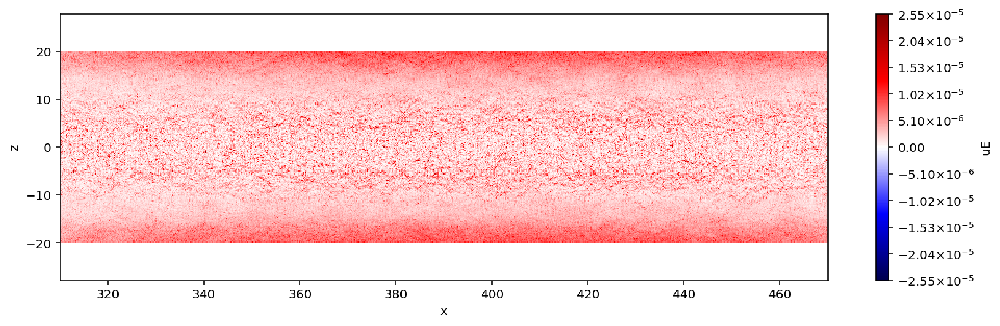

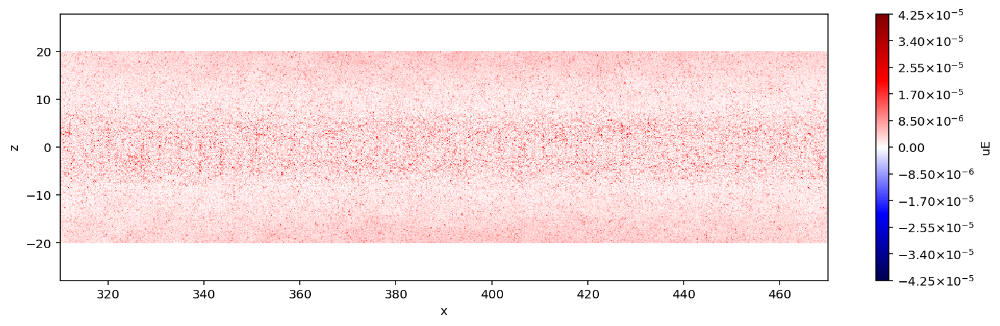

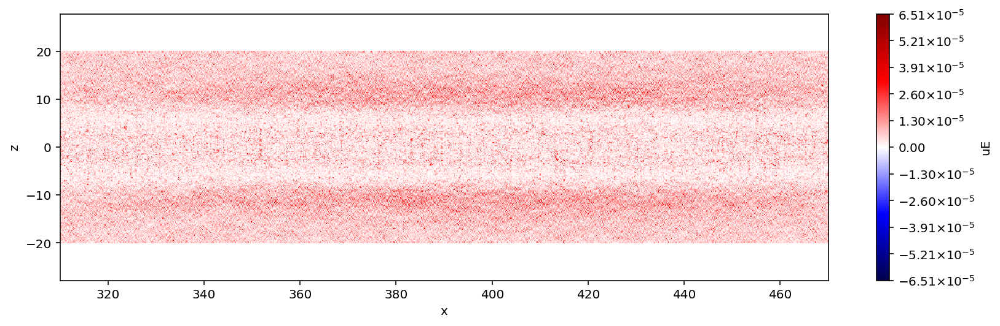

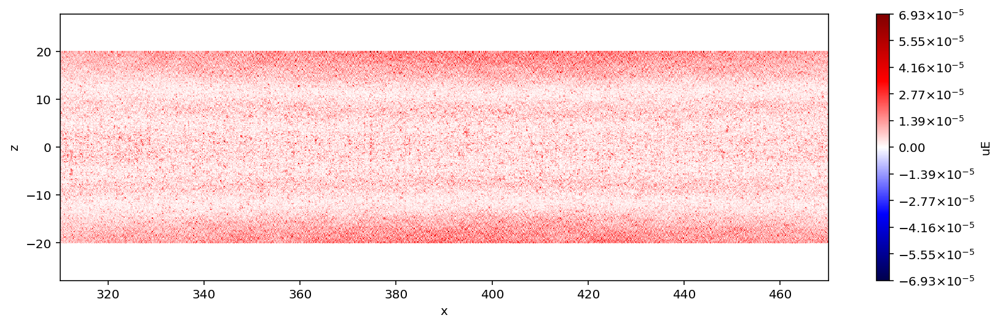

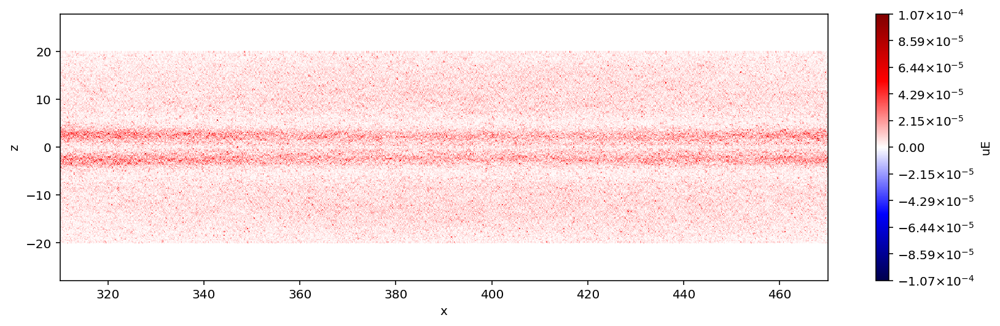

...

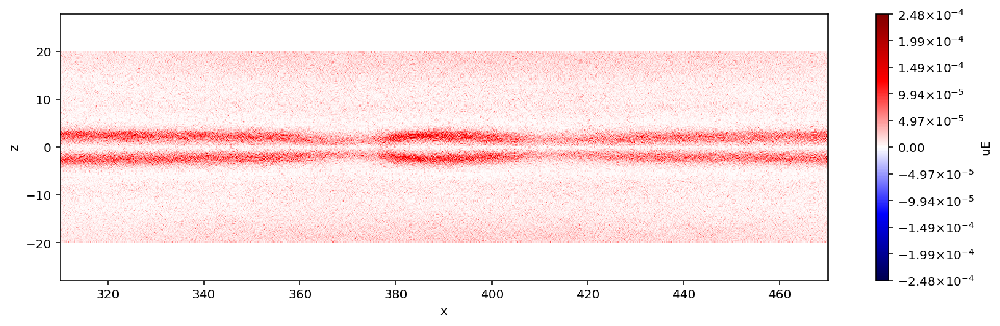

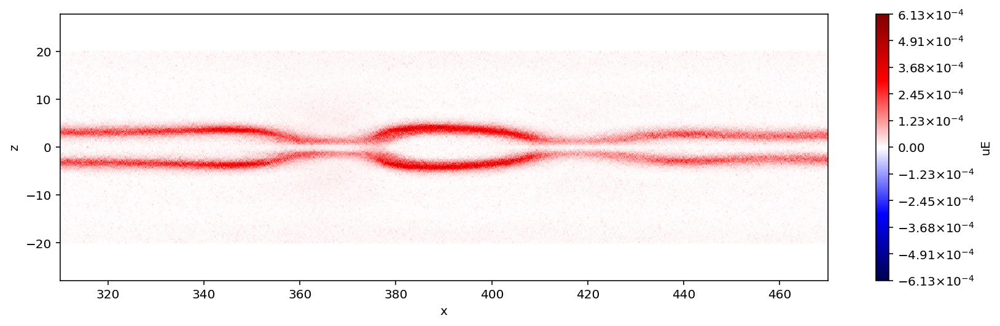

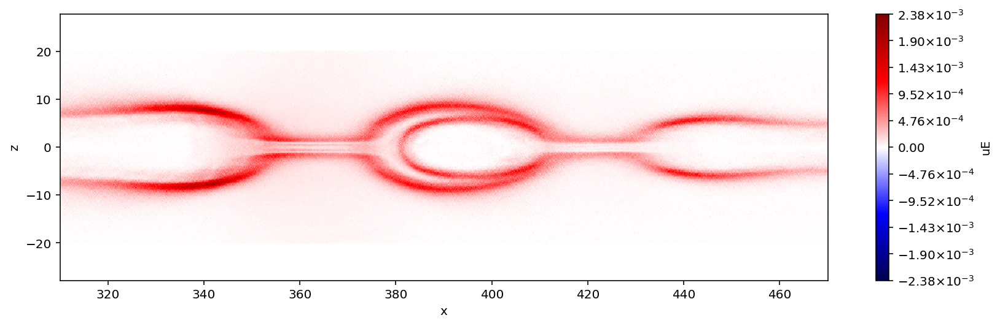

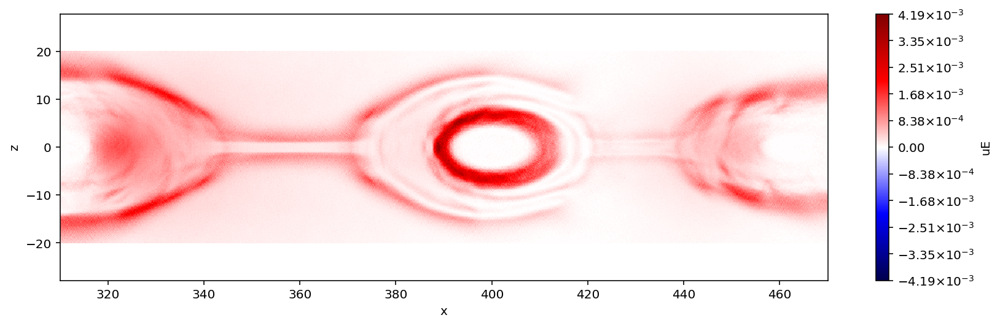

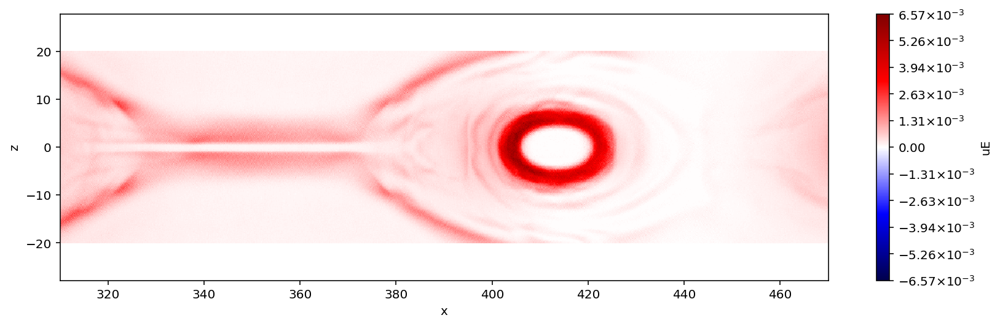

In [29]:
JEe = "ej=(jx_nc_e*ex_ec + jy_nc_e*ey_ec + jz_nc_e*ez_ec)"
JEex = "ejx=(jx_nc_e*ex_ec)"
JEey = "ejy=(jy_nc_e*ey_ec)"
JEez = "ejz=(jz_nc_e*ez_ec)"


JE = "ej=((jx_nc_e + jx_nc_i)*ex_ec + (jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + (jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"
JEx = "ejx=((jx_nc_e + jx_nc_i)*ex_ec + 0*(jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + 0*(jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"
JEy = "ejy=(0*(jx_nc_e + jx_nc_i)*ex_ec + (jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + 0*(jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"
JEz = "ejz=(0*(jx_nc_e + jx_nc_i)*ex_ec + 0*(jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + (jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec)"

uE = "uB = (hx_fc)**2 + (hy_fc)**2 + (hz_fc)**2"
uE = "uE = (ex_ec)**2 + (ey_ec)**2 + (ez_ec)**2"

JEi = "ej=(jx_nc_i*ex_ec + jy_nc_i*ey_ec + jz_nc_i*ez_ec)"

n = "n = rho_nc_e  + rho_nc_i"
Tex = "Te = (txx_nc_e + 0*tyy_nc_e + 0*tzz_nc_e)/3"
Tey = "Te = (0*txx_nc_e + tyy_nc_e + 0*tzz_nc_e)/3"
Tez = "Te = (0*txx_nc_e + 0*tyy_nc_e + tzz_nc_e)/3"



selection = "x=310f:470f, z=-20f:20f"
#selection = "x=340f:360f, z=-20f:20f"




t = 1
fld = JEe

fld2 = 'ey_ec'
make_plot(t, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+2, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+4, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+6, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+8, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+10, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+12, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+14, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+16, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+18, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)
make_plot(t+20, run, [uE],cmap = 'seismic',symmetric=True,selection = selection)


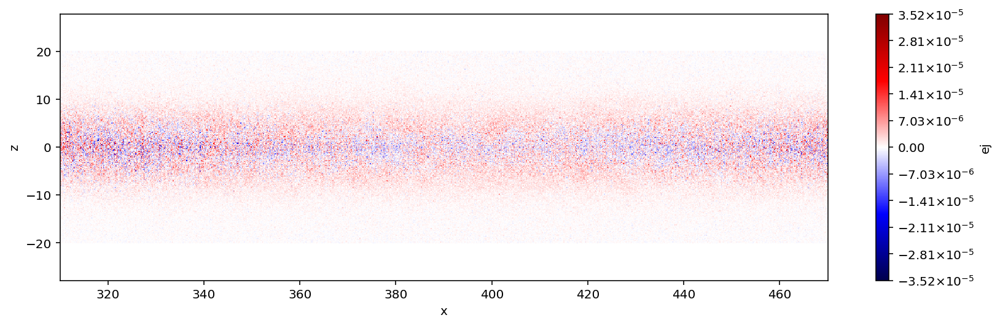

In [74]:
selection = "x=310f:470f, z=-20f:20f"


t = 3
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


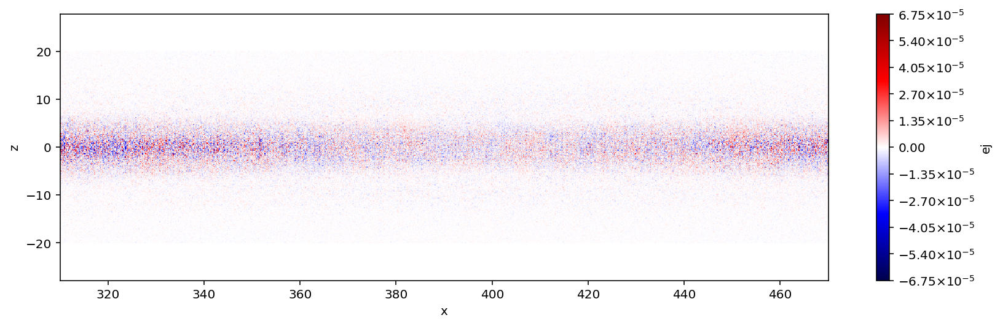

In [37]:
selection = "x=310f:470f, z=-20f:20f"


t = 5
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


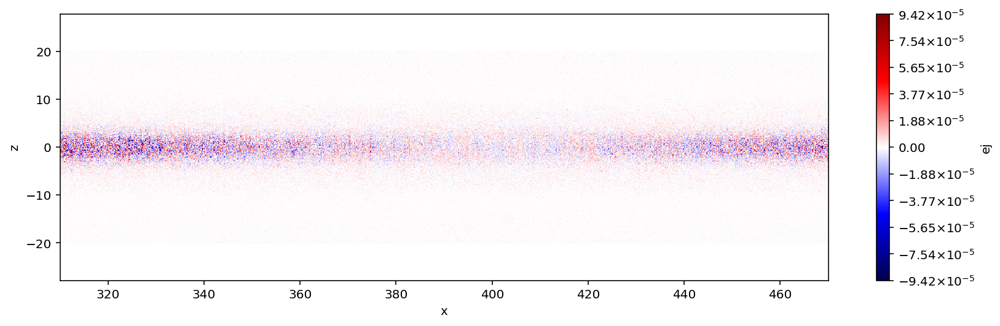

In [38]:
selection = "x=310f:470f, z=-20f:20f"


t = 7
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


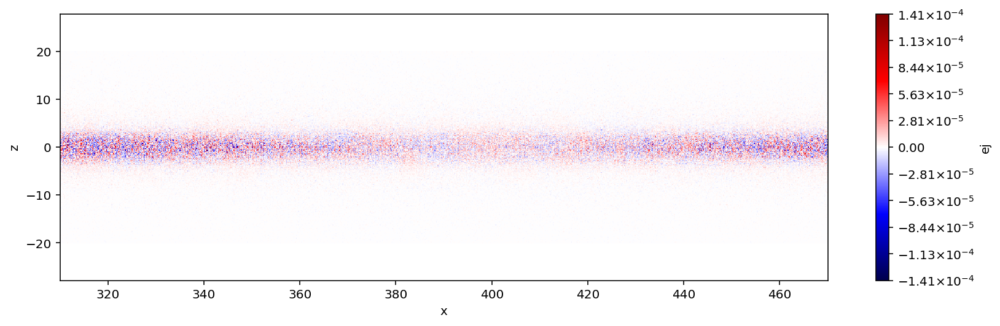

In [39]:
selection = "x=310f:470f, z=-20f:20f"


t = 9
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


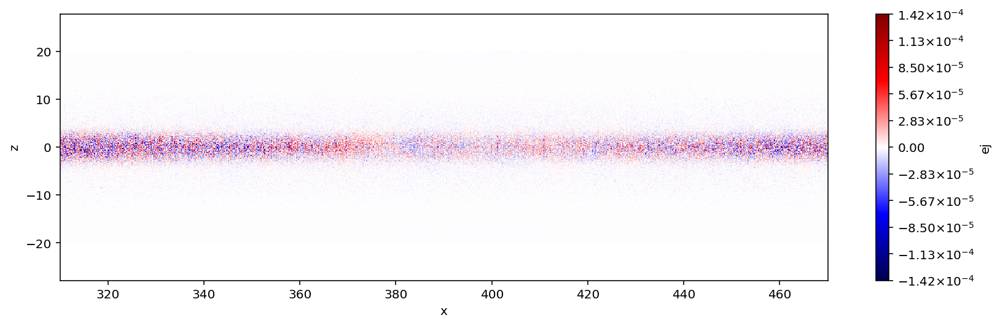

In [40]:
selection = "x=310f:470f, z=-20f:20f"


t = 11
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


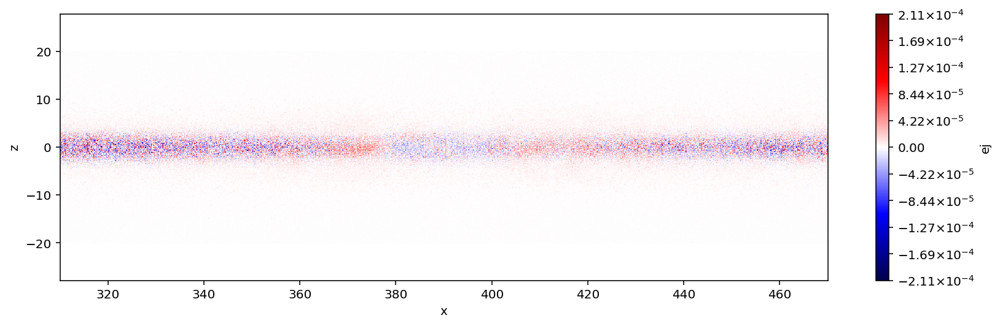

In [42]:
selection = "x=310f:470f, z=-20f:20f"


t = 12
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


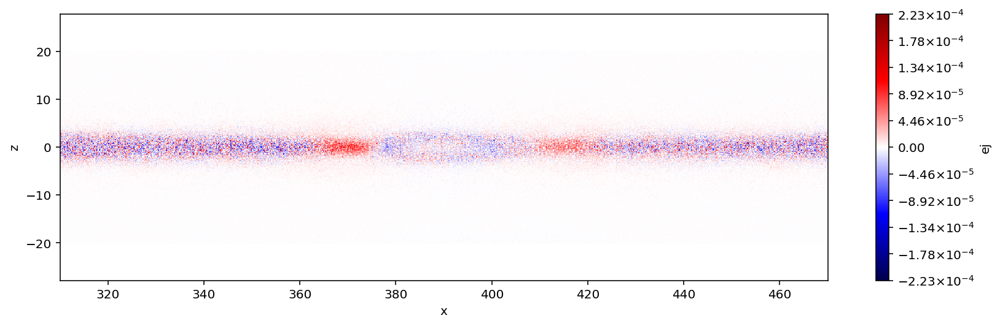

In [43]:
selection = "x=310f:470f, z=-20f:20f"


t = 13
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


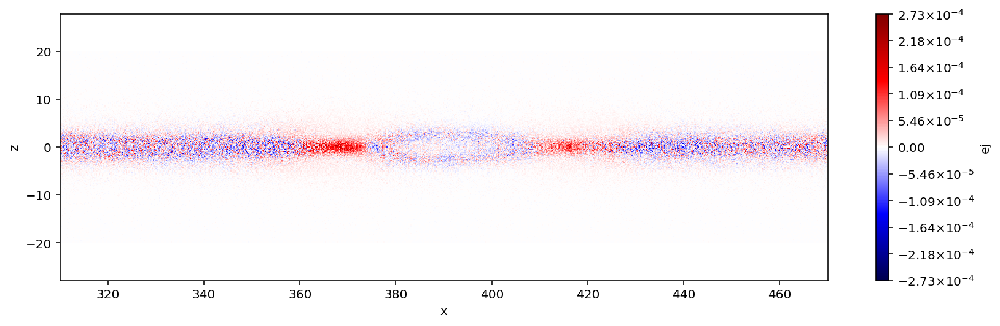

In [44]:
selection = "x=310f:470f, z=-20f:20f"


t = 14
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


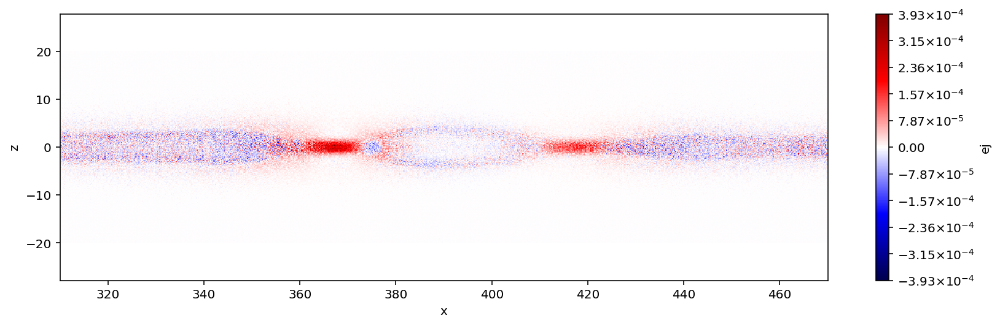

In [45]:
selection = "x=310f:470f, z=-20f:20f"


t = 15
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


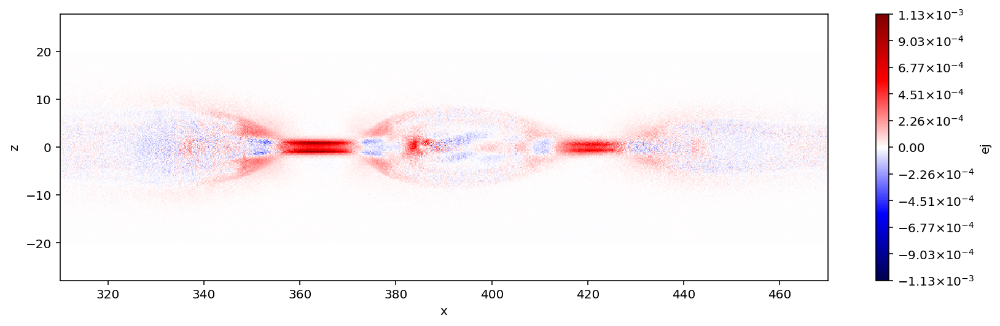

In [46]:
selection = "x=310f:470f, z=-20f:20f"


t = 17
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


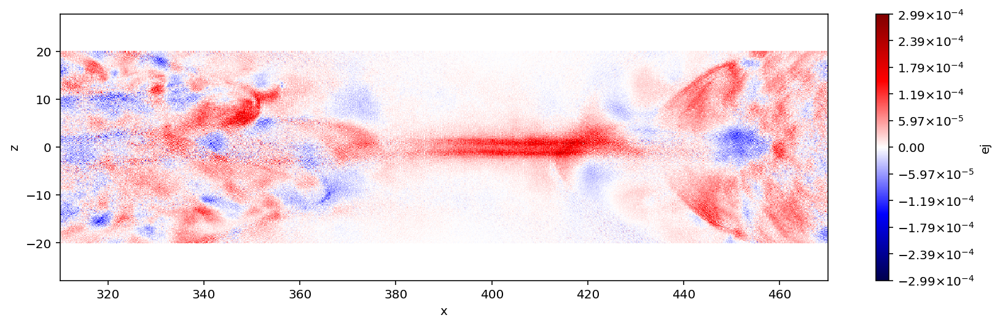

In [79]:
selection = "x=310f:470f, z=-20f:20f"


t = 29
fld = JEe
fld1 = 'jy = jy_nc_e + jy_nc_i'
fld2 = 'ey_ec'
make_plot(t, run, [fld],cmap = 'seismic',symmetric=True,selection = selection)


In [5]:
t = 30
vf = viscid.load_file(run, force_reload=True)
vf.activate_time(t)
Ex, Ey, Ez = vf['ex_ec'], vf['ey_ec'], vf['ez_ec']

Ex.shape

[5120, 1, 1280]

In [5]:

t = 17
vf = viscid.load_file(run, force_reload=True)
vf.activate_time(t)

#make_plot(t, run, ['jy_nc_e'],cmap = 'seismic',symmetric=True,selection = selection)

# These values change depending on the run used
#pt = np.array([0, 5, 350])
xl = np.array([0,-10,-200]) # corner
xl = np.array([0,-5,-100]) # corner

xh = xl + np.array([800,10,200]) # length
gdims = np.array([5120,1,1280]) # gdims
gdims = np.array([5118,1,1278]) # gdims for divs and EJ???

dx = (xh - xl) / gdims

# Interp function for Get_fields fuction 
def interp(a, pt):
    n = ((pt - xl)/dx).astype(int)
    return a[n[0],n[1],n[2]]


# Retrieves E and B at a given 3D position r
# Requires interp function above
def Get_Fields(r):
    Ex, Ey, Ez = vf['ex_ec'], vf['ey_ec'], vf['ez_ec']
    Bx, By, Bz = vf['hx_fc'], vf['hy_fc'], vf['hz_fc']
    
    
    r = np.array([r[0],0,r[2]]) # This Resets the y position to zero
    Ex = interp(Ex,r)
    Ey = interp(Ey,r)
    Ez = interp(Ez,r)
    Bx = interp(Bx,r)
    By = interp(By,r)
    Bz = interp(Bz,r)
    
    E = np.array([Ex, Ey, Ez])
    B = np.array([Bx, By, Bz])
    
    return E, B

def Get_Currents(r):
    Jex, Jey, Jez = vf['jx_nc_e'], vf['jy_nc_e'], vf['jz_nc_e']
    Jix, Jiy, Jiz = vf['jx_nc_i'], vf['jy_nc_i'], vf['jz_nc_i']
    
    
    r = np.array([r[0],0,r[2]]) # This Resets the y position to zero
    Jex = interp(Jex,r)
    Jey = interp(Jey,r)
    Jez = interp(Jez,r)
    Jix = interp(Jix,r)
    Jiy = interp(Jiy,r)
    Jiz = interp(Jiz,r)
    
    Je = np.array([Jex, Jey, Jez])
    Ji = np.array([Jix, Jiy, Jiz])
    
    return Je, Ji


def Em_Evolve():
    t = 0
    vf = viscid.load_file(run, force_reload=True)
    var = np.zeros([31,2])
    while t<31:
        vf.activate_time(t)
        E,B = Get_Fields(np.array([360,0,0]))
        var[t] = [t,E[1]] 
        
        t += 1
        
    return var


        
E_M = Em_Evolve()

#E_M
    
E_M




IndexError: list index out of range

In [34]:
a = vf["hx_fc"]
x, y, z = a.crds.get_crds_nc()

#E,B = Get_Fields(np.array([360,0,0]))
#J_e,J_i = Get_Currents(np.array([360,0,0]))

bx,by,bz = vf["hx_fc"].data, vf["hy_fc"].data, vf["hz_fc"].data
ex,ey,ez = vf["ex_ec"].data, vf["ey_ec"].data, vf["ez_ec"].data
Sx = vf["ey_ec"].data*vf["hz_fc"].data - vf["ez_ec"].data*vf["hy_fc"].data
Sy = vf["ez_ec"].data*vf["hx_fc"].data - vf["ex_ec"].data*vf["hz_fc"].data
Sz = vf["ex_ec"].data*vf["hy_fc"].data - vf["ey_ec"].data*vf["hx_fc"].data
JEx = (vf["jx_nc_e"].data + vf["jx_nc_i"].data)*vf["ex_ec"].data
JEy = (vf["jy_nc_e"].data + vf["jy_nc_i"].data)*vf["ey_ec"].data
JEz = (vf["jz_nc_e"].data + vf["jz_nc_i"].data)*vf["ez_ec"].data

#bx,by,bz = B[0],B[1],B[2]
#ex,ey,ez = E[0],E[1],E[2]
#Sx = Ey*Bz - Ez*By
#Sy = Ez*Bx - Ex*Bz
#Sz = Ex*By - Ey*Bx
#JEx = (vf["jx_nc_e"].data + vf["jx_nc_i"].data)*vf["ex_ec"].data
#JEy = (vf["jy_nc_e"].data + vf["jy_nc_i"].data)*vf["ey_ec"].data
#JEz = (vf["jz_nc_e"].data + vf["jz_nc_i"].data)*vf["ez_ec"].data



dx, dy, dz = a.crds.get_dx()

divS = (Sx[2:,0,1:-1] - Sx[:-2,0,1:-1]) / (2*dx[0])  + (Sz[1:-1,0,2:] - Sz[1:-1,0,:-2]) / (2*dz[0])
JE = (JEx[2:,0,1:-1] + JEx[:-2,0,1:-1]) / (2*dx[0])  + (JEz[1:-1,0,2:] + JEz[1:-1,0,:-2]) / (2*dz[0])

JE.shape, divS.shape
#JE[1000,1]


((5118, 1278), (5118, 1278))

In [43]:

divS[2303,639],JE[2303,639]

(-0.00023495175, -0.0005639146)

In [65]:
du = [None]*30
JdotE = [None]*30
Div_S = [None]*30
for t in range(30):
    vf = viscid.load_file(run, force_reload=True)
    vf.activate_time(t)
    a = vf["hx_fc"]
    x, y, z = a.crds.get_crds_nc()
    Sx = vf["ey_ec"].data*vf["hz_fc"].data - vf["ez_ec"].data*vf["hy_fc"].data
    Sy = vf["ez_ec"].data*vf["hx_fc"].data - vf["ex_ec"].data*vf["hz_fc"].data
    Sz = vf["ex_ec"].data*vf["hy_fc"].data - vf["ey_ec"].data*vf["hx_fc"].data
    JEx = (vf["jx_nc_e"].data + vf["jx_nc_i"].data)*vf["ex_ec"].data
    JEy = (vf["jy_nc_e"].data + vf["jy_nc_i"].data)*vf["ey_ec"].data
    JEz = (vf["jz_nc_e"].data + vf["jz_nc_i"].data)*vf["ez_ec"].data
    dx, dy, dz = a.crds.get_dx()

    divS = (Sx[2:,0,1:-1] - Sx[:-2,0,1:-1]) / (2*dx[0])  + (Sz[1:-1,0,2:] - Sz[1:-1,0,:-2]) / (2*dz[0])
    JE = (JEx[2:,0,1:-1] + JEx[:-2,0,1:-1]) / (2*dx[0])  + (JEz[1:-1,0,2:] + JEz[1:-1,0,:-2]) / (2*dz[0]) + (JEy[1:-1,0,2:] + JEy[1:-1,0,:-2]) / (2*dy[0])
    
    # Need to work on a better method of choosing a point at the x-line
    # I don't think this approximation is working well
    a = 2280
    b = 639
    JdotE[t] = JE[a,b]
    Div_S[t] = divS[a,b]
    du[t] = - JE[a,b] - divS[a,b]

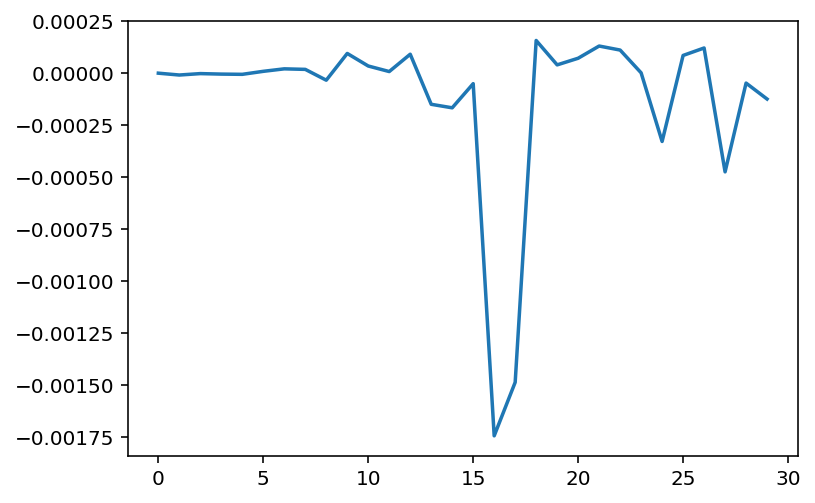

In [66]:
plt.plot(JdotE)


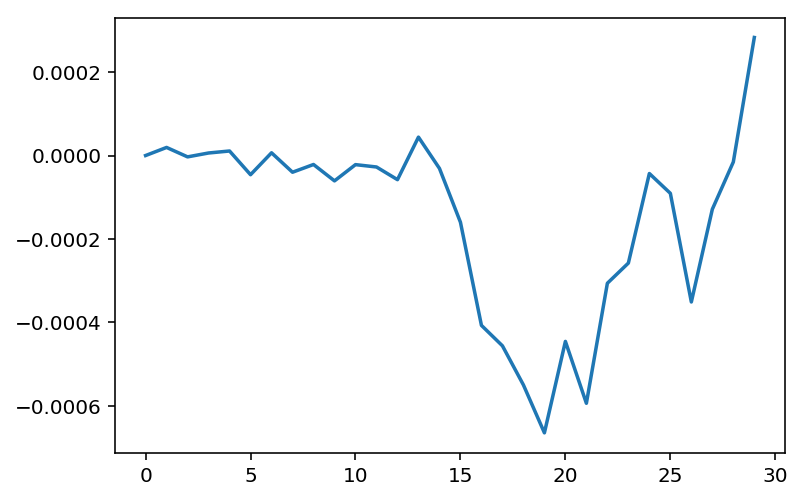

In [67]:
plt.plot(Div_S)


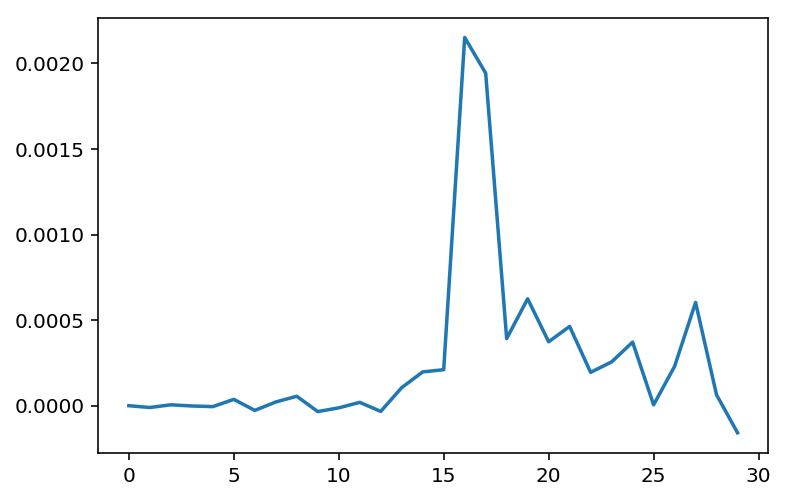

In [68]:
plt.plot(du)


In [141]:
JdotE = np.ones([5118,1,1278])
Div_S = np.ones([5118,1,1278])
for i in range(5118):
    for j in range(1278):
        JdotE[i,0,j] = JE[i,j]
        Div_S[i,0,j] = divS[i,j]

JdotE.shape

(5118, 1, 1278)

In [135]:
JdotE[3000,0,500],JE[3000,500]

(-0.00027754335314966738, -0.00027754335)

In [137]:
#Getting a bit lost here
# Trying to turn JE with shape (5118,1278) into JdotE with shape (5118,1,1278)
# 


JdotE = np.array([5118,1,1278])
Div_S = np.array([5118,1,1278])

for i in range(5118 -1):
    for j in range(1278-1):
        JdotE[i,0,j] = JE[i,j]
        Div_S[i,0,j] = divS[i,j]

def Get_Terms(r):
    
    
    r = np.array([r[0],0,r[2]]) # This Resets the y position to zero
    J_dot_E = interp(JdotE,r)
    Div__S = interp(Div_S,r)
    
    
    return J_dot_E, Div__S
JdotE,Div_S = Get_Terms(np.array([360,0,0]))

IndexError: too many indices for array

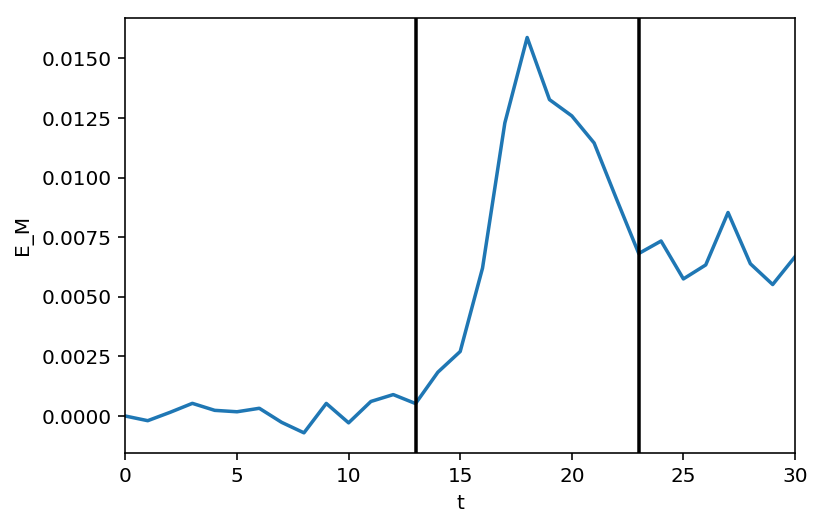

In [18]:
plt.plot(E_M[:,0],E_M[:,1])
#plt.figure(figsize=(20,6))
#plt.subplot(1,2,1)
plt.xlim(0,30)
#plt.ylim(-0.01,0.02)
plt.axvline(x=13, color = 'k')
plt.axvline(x=23,color = 'k')
plt.ylabel('E_M')
plt.xlabel('t')
#plt.plot(E_M[:,0],E_M[:,1], 'red')
plt.show()

NameError: name 'divS' is not defined

In [43]:
var = np.zeros([19,2])
i = 0
while i<19:
    var[i] = [i,i*2]
    i+=1
var[18,1]

36.0

In [6]:
def read_particles(dir, step=0, proc=0):
    filename = "{}/prt.{:06d}_p{:06d}.h5".format(dir, step, proc)
    file = h5py.File(filename, "r")
    particles = file["particles/p0/1d"]
    idx_begin = file["particles/p0/idx_begin"]
    idx_end = file["particles/p0/idx_end"]

    return particles, idx_begin, idx_end


In [7]:
# Find particle data file for chosen timestep 

t = 17
import os
dirlist = os.listdir(dir)
dirlist = [x for x in dirlist if "prt" in x ]


#This defines the variable ThePrt: a 5 or 6 digit number indicating
#the timestep in the particle output file
if dirlist[t][:5] == 'prt.1':
    ThePrt = int(dirlist[t][4:10]) 
else:
    ThePrt = int(dirlist[t][5:10])

#Read_Particles will force the 2nd argument to be 6 digits anyway, 
# so if ThePrt = 95069 read particles automatically matches the prt format
# with 095069
particles, idx_begin, idx_end = read_particles(dir, ThePrt)
#This defines the variable ThePrt: a 5 or 6 digit number indicating
#the timestep in the particle output file

#particles, idx_begin, idx_end = read_particles(dir, 36568)
ThePrt

124321

In [21]:
#sl = np.array([380,0,-5])
#sh = np.array([400,0,5])

#I think the issue is here


# These are the bounds of the rectangular region that one wants to read particles for
# in d_e
sl = np.array([740,0,-2])
sh = np.array([772,0,2])

#sl = np.array([746,0,-5])
#sh = np.array([758,0,5])

# Size of simulation domain (in d_e)
xl = np.array([0,-10,-200])
#xl = np.array([0,-5,-100])
#xh = xl + np.array([800,10,200])
xh = xl + np.array([1600,20,400])
# Number of cells of entire simulation
gdims = np.array([10240, 1, 2560])
particle_start = np.array([3840, 0, 960])
particle_count = np.array([idx_begin.shape[3], idx_begin.shape[2], idx_begin.shape[1]])

idx_begin, idx_end
dx = (xh - xl) / gdims

il = ((sl - xl) / dx).astype(int)
ih = ((sh - xl) / dx).astype(int)

def in_cell(kind, iz, iy, ix):
    loc = kind, iz - particle_start[2], iy - particle_start[1], ix - particle_start[0]
    return slice(idx_begin[loc], idx_end[loc])

il, ih

(array([4736,    0, 1267]), array([4940,    0, 1292]))

In [22]:
cnt = 0
slices = []
for iz in range(il[2], ih[2]):
    for ix in range(il[0], ih[0]):
        for kind in range(2):
            r = in_cell(kind, iz, 0, ix)
            cnt += int(r.stop - r.start)
            slices.append(r)
        
s_min = min(s.start for s in slices)
s_max = max(s.stop for s in slices)
    
len(slices), cnt, s_min, s_max

(10200, 5095151, 365281352, 1289189803)

In [23]:
prt = particles[0]
prts = np.zeros(cnt, dtype=prt.dtype)
cnt = 0
for sl in slices:
    l = int(sl.stop - sl.start)
    prts[cnt:cnt+l] = particles[sl.start:sl.stop]
    cnt += l
    
    
df = pd.DataFrame(prts)
vf = viscid.load_file(run, force_reload=True)
#vf.activate_time(17)
df[df.q<1]

,x,y,z,px,py,pz,q,m,w
0,740.085938,7.657301,-1.932541,0.540219,-0.126647,0.172137,-1.0,1.0,0.000333
1,740.030457,1.979282,-2.011261,0.604976,-0.118973,0.067253,-1.0,1.0,0.000333
2,740.121704,-4.746546,-1.924347,0.713614,-0.704263,0.019336,-1.0,1.0,0.000333
3,740.062500,9.309494,-1.930969,0.557230,0.000896,-0.007554,-1.0,1.0,0.000333
4,740.002747,7.024776,-1.926422,0.485294,-0.128537,-0.005228,-1.0,1.0,0.000333
5,740.132874,3.724373,-1.983765,0.557620,-0.388780,-0.044593,-1.0,1.0,0.000333
6,740.082886,-0.349621,-1.995712,0.640053,-0.216290,-0.084598,-1.0,1.0,0.000333
7,740.065491,-5.437280,-2.026596,0.524943,-0.015402,0.170144,-1.0,1.0,0.000333
8,740.081055,8.613605,-1.971161,0.515156,-0.335596,-0.049235,-1.0,1.0,0.000333
9,740.130127,6.695421,-1.995087,0.633949,0.087012,-0.087671,-1.0,1.0,0.000333


In [43]:
## I want to go into the dataframe and be able to select a particle that has the median value of some quantity, 
## in this case the 'eng_sqrd' parameter, which is really the magnitude of the momentum squared.  
## Ultimately, I want to be able to select a sample of multiple particles from a given region that vary in some parameter
## and input the x,y,x,px,py,pz values of each particle directly into the pusher code.  


#import math
#print(len(df[df.px>0]))
#print(len(df))"

#df.mean(axis=0)

#df['eng_sqrd'] = (df['px']**2 + df['py']**2 + df['pz']**2)

## I can identify the median value, but I'm not sure how to pick out the particle in the dataframe 
## with that value...
#med = df["eng_sqrd"].med()



#df.loc[df['column_name'] == some_value]

#df.loc[df['eng_sqrd'] == med]

#n = df.loc[lambda df: df['eng_sqrd'] == med]

#test = df[df.eng_sqrd < med]

##x = n["x"].median()
#y = n["y"].median()
#z = n["z"].median()
#px = n["px"].median()
#py = n["py"].median()
#pz = n["pz"].median()

#r = np.array([x,y,z])
#p = np.array([px,py,pz])

#r,p

df = pd.DataFrame(prts)

#print(a)
df = df.loc[lambda df: df["x"] < 752] 
df = df.loc[lambda df: df["x"] > 750]
df = df.loc[lambda df: df["z"] < 1] 
df = df.loc[lambda df: df["z"] > -1]


#df = df.loc[lambda df: df["x"] > 750]






#print(med)
df.head

<bound method NDFrame.head of                   x         y         z        px        py        pz    q  \
1765361  750.077759  8.961317 -0.978638 -0.207063 -0.090444 -0.255230 -1.0   
1765364  750.104065  8.910255 -0.941544  0.398314 -0.249245 -0.283752 -1.0   
1765365  750.130371 -7.662096 -0.973068 -0.281404 -0.333973 -0.295701 -1.0   
1765368  750.106934  2.377635 -0.972351  0.176812 -0.358925 -0.256706 -1.0   
1765370  750.060913  7.897192 -0.979767  0.227514 -0.305663 -0.261707 -1.0   
1765373  750.128784  2.466459 -0.945602  0.114765 -0.332978 -0.229826 -1.0   
1765374  750.141602  5.011427 -0.941788  0.065556 -0.211310 -0.249205 -1.0   
1765375  750.084900 -6.445679 -0.988586 -0.463848 -0.476248 -0.297098 -1.0   
1765376  750.107117 -6.566065 -0.984680 -0.553197  0.185101 -0.292602 -1.0   
1765377  750.128540 -0.993997 -0.977325 -0.477479  0.214020 -0.272269 -1.0   
1765379  750.079712 -5.102963 -0.991394  0.358094  0.159100 -0.414343 -1.0   
1765381  750.083069  9.902004 -0.9

In [11]:
# Selects particles with min, median, and max energy in a dataframe 
def Particle_Select():
    df['eng_sqrd'] = (df['px']**2 + df['py']**2 + df['pz']**2)
    
    min = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].min()]
    med = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].median()]
    max = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].max()]
    
    r_min = np.array([min["x"].median(),min["y"].median(),min["z"].median()])
    p_min = np.array([min["px"].median(),min["py"].median(),min["pz"].median()])
    
    r_med = np.array([med["x"].median(),med["y"].median(),med["z"].median()])
    p_med = np.array([med["px"].median(),med["py"].median(),med["pz"].median()])
    
    r_max = np.array([max["x"].median(),max["y"].median(),max["z"].median()])
    p_max = np.array([max["px"].median(),max["py"].median(),max["pz"].median()])

    return r_min, r_med, r_max, p_min, p_med, p_max, 


r0,r1,r2,p0,p1,p2 = Particle_Select()

    
    


    
    
print(p0,p1,p2)

[-0.00050522 -0.00015533  0.00014021] [ nan  nan  nan] [-0.84327662 -0.56017917 -1.84273899]


In [11]:
# Selects 5 particles ranging from min to max enery in a dataframe
def Particle_Select():
    df['eng_sqrd'] = (df['px']**2 + df['py']**2 + df['pz']**2)
    
    min = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].min()]
    med = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].median()]
    max = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].max()]
    
    minmed = df.loc[lambda df: df['eng_sqrd'] < df["eng_sqrd"].median()]
    minmed = minmed.loc[lambda df: minmed['eng_sqrd'] == minmed["eng_sqrd"].median()]
    
    medmax = df.loc[lambda df: df['eng_sqrd'] > df["eng_sqrd"].median()]
    medmax = medmax.loc[lambda df: medmax['eng_sqrd'] == medmax["eng_sqrd"].median()]
    
    r_min = np.array([min["x"].median(),min["y"].median(),min["z"].median()])
    p_min = np.array([min["px"].median(),min["py"].median(),min["pz"].median()])
    
    r_minmed = np.array([minmed["x"].median(),minmed["y"].median(),minmed["z"].median()])
    p_minmed = np.array([minmed["px"].median(),minmed["py"].median(),minmed["pz"].median()])
    
    r_med = np.array([med["x"].median(),med["y"].median(),med["z"].median()])
    p_med = np.array([med["px"].median(),med["py"].median(),med["pz"].median()])
    
    r_medmax = np.array([medmax["x"].median(),medmax["y"].median(),medmax["z"].median()])
    p_medmax = np.array([medmax["px"].median(),medmax["py"].median(),medmax["pz"].median()])
    
    r_max = np.array([max["x"].median(),max["y"].median(),max["z"].median()])
    p_max = np.array([max["px"].median(),max["py"].median(),max["pz"].median()])

    return r_min, r_minmed, r_med, r_medmax, r_max, p_min, p_minmed, p_med, p_medmax, p_max, 


r0,r1,r2,r3,r4,p0,p1,p2,p3,p4 = Particle_Select()





In [44]:
df['eng_sqrd'] = (df['px']**2 + df['py']**2 + df['pz']**2)
min = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].min()]
med = df.loc[lambda df: df['eng_sqrd'] == df["eng_sqrd"].median()]
minmed = df.loc[lambda df: df['eng_sqrd'] < df["eng_sqrd"].median()]
medmax = df.loc[lambda df: df['eng_sqrd'] > df["eng_sqrd"].median()]


a = minmed.loc[lambda df: minmed['eng_sqrd'] == minmed["eng_sqrd"].median()]



,x,y,z,px,py,pz,q,m,w,eng_sqrd
55951,750.663818,-3.96333,-1.278305,0.106068,-0.045922,-0.060322,-1.0,1.0,0.000333,0.016998


In [19]:
# Define points where vdfs will be taken from
# ab = [number of coordinates,components of coordinates (always 2)]

ab = np.zeros([4,2]) 

#ab[0] = [775,0]
ab[0] = [770,0]
ab[1] = [760,0]
ab[2] = [750,0]
ab[3] = [740,0]

ab

array([[ 770.,    0.],
       [ 760.,    0.],
       [ 750.,    0.],
       [ 740.,    0.]])

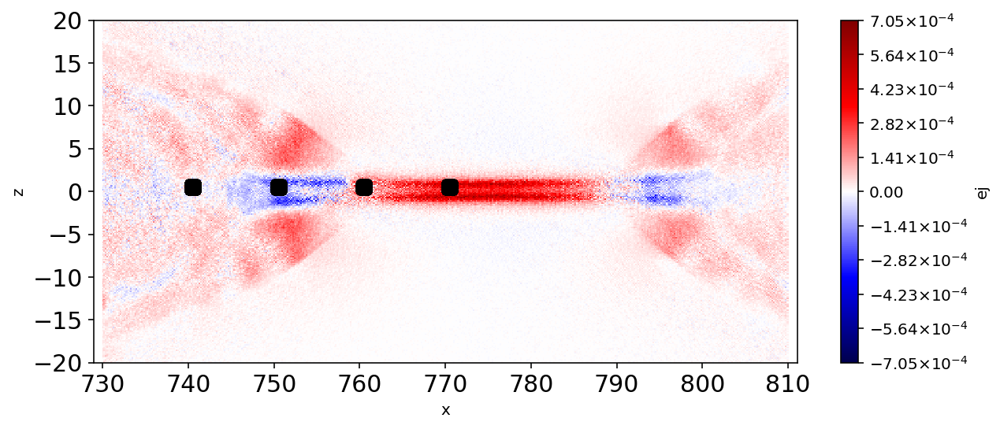

In [45]:
vf.activate_time(17)
electrons = df[df.q < 0]
selection = "x=730f:810f, z=-20f:20f"

s_y0 = (electrons.z >= ab[0][1]) & (electrons.z <= ab[0][1] +1)
s_y1 = (electrons.z >= ab[1][1]) & (electrons.z <= ab[1][1] +1)
s_y2 = (electrons.z >= ab[2][1]) & (electrons.z <= ab[2][1] +1)
s_y3 = (electrons.z >= ab[3][1]) & (electrons.z <= ab[3][1] +1)
s_x0 = (electrons.x >= ab[0][0]) & (electrons.x <= ab[0][0] +1)
s_x1 = (electrons.x >= ab[1][0]) & (electrons.x <= ab[1][0] +1)
s_x2 = (electrons.x >= ab[2][0]) & (electrons.x <= ab[2][0] +1)
s_x3 = (electrons.x >= ab[3][0]) & (electrons.x <= ab[3][0] +1)


fig, ax = plt.subplots(figsize=(10, 4))
vlt.plot(vf["ej = jx_nc_e*ex_ec + jy_nc_e*ey_ec + jz_nc_e*ez_ec"],symmetric=True, selection=selection, ax=ax, cmap='seismic')
electrons[s_y0 & s_x0 |s_y1 & s_x1|s_y2 & s_x2 |s_y3 & s_x3].iloc[::1].\
    plot.scatter(x="x", y="z", c="k", ax=ax,fontsize = 15, alpha=1, colorbar=None)
ax.set_aspect("equal")

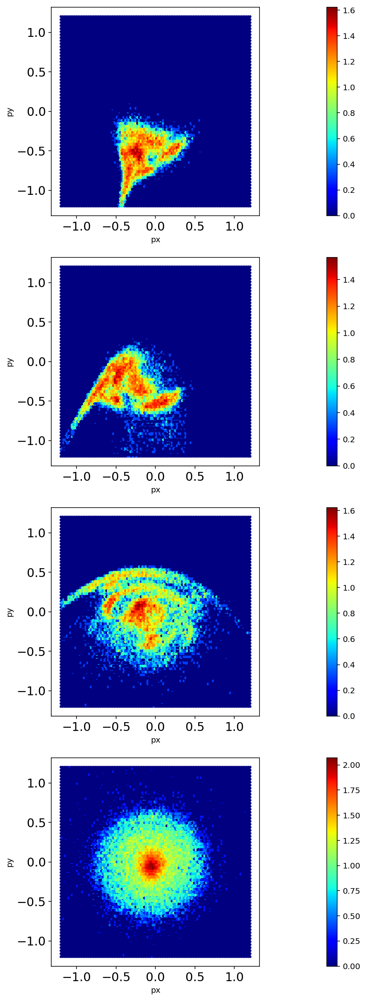

In [52]:
kwargs = {"gridsize": 110, "extent": (-1.2, 1.2, -1.2, 1.2), "cmap": 'jet', 'fontsize':15}
#kwargs = {"gridsize": 80, "extent": (-0.1, 0.1, -0.1, 0.1), "cmap": 'jet'}
fig, ax = plt.subplots(4, 1, figsize=(30,22))
ax = ax.flatten()


electrons[s_y0 & s_x0].plot.hexbin(x='px', y='py', bins="log", ax=ax[0], **kwargs)
electrons[s_y1 & s_x1].plot.hexbin(x='px', y='py', bins="log", ax=ax[1], **kwargs)
electrons[s_y2 & s_x2].plot.hexbin(x='px', y='py', bins="log", ax=ax[2], **kwargs)
electrons[s_y3 & s_x3].plot.hexbin(x='px', y='py', bins="log", ax=ax[3], **kwargs)


[a.set_aspect("equal") for a in ax];

#make_plot(t, run, [JE2],cmap = 'seismic',symmetric=True,selection = selection)